**Import libraries**

In [ ]:
import numpy as np
import pandas as pd
import glob
import cv2
import os
import seaborn as sns
from skimage.filters import sobel
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import layers,models
from keras.models import model_from_json
from keras.models import load_model
from keras.applications import VGG16
from keras.models import Model

In [ ]:
#Resizing image
size = 128

**Connect to Google Drive to get dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


**Train dataset**

In [ ]:
#train dataset directory
dataset_directory = '/content/drive/MyDrive/Dataset/Train'

#empty lists to store train images and their labels
train_images = []
train_labels = []

for directory_path, _, filenames in os.walk(dataset_directory):
    label = directory_path.split("/")[-1]
    # print(label)
    for filename in filenames:
        img_path = os.path.join(directory_path, filename)

        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        # height, width, _ = img.shape
        # print(f"Image width: {width} pixels")
        # print(f"Image height: {height} pixels")
        img = cv2.resize(img, (size, size))
        train_images.append(img)
        train_labels.append(label)

train_images = np.array(train_images)
train_labels = np.array(train_labels)

**Test dataset**

In [ ]:
#test dataset directory
dataset_test = '/content/drive/MyDrive/Dataset/Test'

#empty lists to store train images and their labels
test_images = []
test_labels = []

for directory_path, _, filenames in os.walk(dataset_test):
    label = directory_path.split("/")[-1]
    for filename in filenames:
        img_path = os.path.join(directory_path, filename)

        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img = cv2.resize(img, (size, size))
        test_images.append(img)
        test_labels.append(label)

test_images = np.array(test_images)
test_labels = np.array(test_labels)

In [ ]:
# Double-check to assure the array contains all the required images
from IPython.display import display
from PIL import Image

# for i, image in enumerate(train_images):
#     img = Image.fromarray(image)
#     display(img)

In [ ]:
#Encode labels to integers
from sklearn import preprocessing

encodeTool = preprocessing.LabelEncoder()
encodeTool.fit(test_labels)
test_labels_encoded = encodeTool.transform(test_labels)
encodeTool.fit(train_labels)
train_labels_encoded = encodeTool.transform(train_labels)

In [ ]:
#Split data into test and train datasets
x_train, x_test = train_images, test_images
y_train, y_test = train_labels_encoded, test_labels_encoded


#Normalize pixel value between 0 and 1
x_train,x_test = x_train/255.0, x_test/255.0

**Build a Convolutional Neural Networks model to extract feature**

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

# Load the VGG16 model
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
# Add custom layers
flatten_layer = layers.Flatten()(vgg_model.output)
fc_layer1 = layers.Dense(1024, activation='relu')(flatten_layer)
dropout1 = layers.Dropout(0.5)(fc_layer1)
batch_norm1 = BatchNormalization()(dropout1)
fc_layer2 = layers.Dense(512, activation='relu')(batch_norm1)
dropout2 = layers.Dropout(0.5)(fc_layer2)
batch_norm2 = BatchNormalization()(dropout2)
output = layers.Dense(1, activation='sigmoid')(batch_norm2)
# Create a new model
model = Model(vgg_model.input, output)

In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers import BatchNormalization

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True)

# Early stopping and model checkpointing
early_stopping = EarlyStopping(monitor='val_loss', patience=10)
model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True)


In [ ]:
from keras.optimizers import Adam

# Compile the model
model.compile(
    optimizer=Adam(),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Fit the model using data augmentation generator
history = model.fit(datagen.flow(x_train, y_train, batch_size=32),
                    steps_per_epoch=len(x_train) / 32,
                    epochs=12,
                    validation_data=(x_test, y_test),
                    callbacks=[early_stopping, model_checkpoint])

Epoch 1/12
13/13 [==============================] - 8s 205ms/step - loss: 0.1646 - accuracy: 0.9567 - val_loss: 99.4294 - val_accuracy: 0.9328
Epoch 2/12
13/13 [==============================] - 3s 194ms/step - loss: 0.1087 - accuracy: 0.9760 - val_loss: 1961.2542 - val_accuracy: 0.8582
Epoch 3/12
13/13 [==============================] - 4s 338ms/step - loss: 0.1251 - accuracy: 0.9712 - val_loss: 0.3491 - val_accuracy: 0.8433
Epoch 4/12
13/13 [==============================] - 5s 368ms/step - loss: 0.0860 - accuracy: 0.9808 - val_loss: 0.0877 - val_accuracy: 0.9776
Epoch 5/12
13/13 [==============================] - 3s 183ms/step - loss: 0.1242 - accuracy: 0.9639 - val_loss: 247.5921 - val_accuracy: 0.9403
Epoch 6/12
13/13 [==============================] - 3s 194ms/step - loss: 0.0934 - accuracy: 0.9808 - val_loss: 414.3076 - val_accuracy: 0.8358
Epoch 7/12
13/13 [==============================] - 4s 289ms/step - loss: 0.1406 - accuracy: 0.9567 - val_loss: 1613.5612 - val_accuracy: 0.

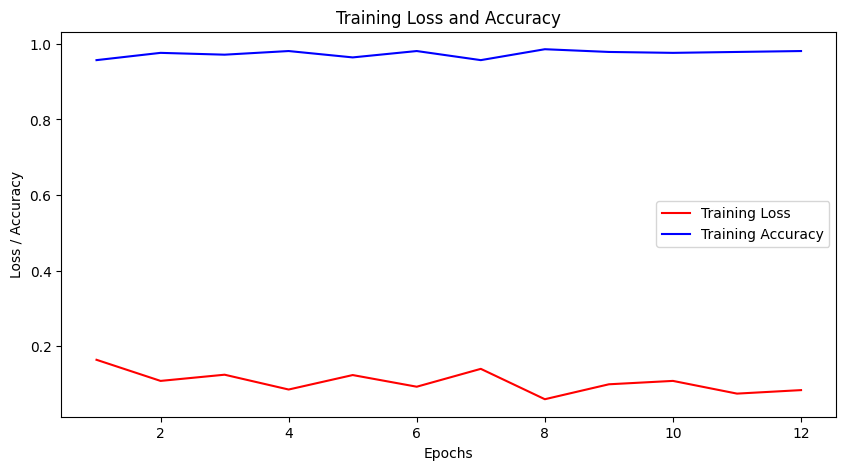

In [ ]:
import matplotlib.pyplot as plt

# Access the training history
loss = history.history['loss']
accuracy = history.history['accuracy']

# Create a list of the epochs (assuming it starts from 1)
epochs = range(1, len(loss) + 1)

# Create a figure
plt.figure(figsize=(10, 5))

# Plot loss
plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, accuracy, 'b', label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss / Accuracy')
plt.title('Training Loss and Accuracy')
plt.legend()

# Show the plot
plt.show()

In [ ]:
model.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0   

**Save model**

In [ ]:
#Preserve the result of the trained model for further use
model.save("best_model.h5")
print("Model saved to disk")

Model saved to disk


In [ ]:
#Load model
model_loaded = load_model('best_model.h5')

**Make prediction on the test dataset**

In [ ]:
#Prediction
test_prediction = model.predict(x_test)

5/5 [==============================] - 0s 48ms/step


In [ ]:
pred = []

for i in test_prediction:
  # print(i)
  if(i >= 0.5):
    pred.append(1)
  else:
    pred.append(0)

# pred

In [ ]:
#Inverse binary label to original class labels

test = encodeTool.inverse_transform(pred)
test

array(['Parasite', 'Parasite', 'Uninfected', 'Uninfected', 'Uninfected',
       'Parasite', 'Uninfected', 'Uninfected', 'Uninfected', 'Uninfected',
       'Uninfected', 'Uninfected', 'Uninfected', 'Uninfected',
       'Uninfected', 'Uninfected', 'Uninfected', 'Uninfected',
       'Uninfected', 'Uninfected', 'Uninfected', 'Uninfected',
       'Uninfected', 'Uninfected', 'Uninfected', 'Uninfected',
       'Uninfected', 'Uninfected', 'Uninfected', 'Uninfected',
       'Uninfected', 'Uninfected', 'Uninfected', 'Uninfected',
       'Uninfected', 'Uninfected', 'Uninfected', 'Uninfected',
       'Uninfected', 'Uninfected', 'Uninfected', 'Uninfected',
       'Uninfected', 'Parasite', 'Parasite', 'Parasite', 'Parasite',
       'Parasite', 'Parasite', 'Parasite', 'Parasite', 'Parasite',
       'Parasite', 'Parasite', 'Parasite', 'Parasite', 'Parasite',
       'Parasite', 'Uninfected', 'Parasite', 'Uninfected', 'Parasite',
       'Parasite', 'Parasite', 'Parasite', 'Parasite', 'Parasite',
       

In [ ]:
accuracy = model_loaded.evaluate(x_test,y_test)
print("Accuracy: ",accuracy)

5/5 [==============================] - 0s 46ms/step - loss: 0.1204 - accuracy: 0.9552
Accuracy:  [0.12041174620389938, 0.9552238583564758]


In [ ]:
#print overall accuracy
from sklearn import metrics

print("Accuracy = ",metrics.accuracy_score(test_labels,test))

Accuracy =  0.9552238805970149


1/1 [==============================] - 0s 173ms/step


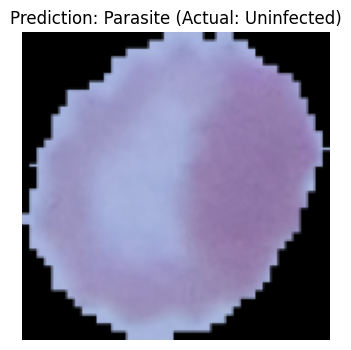

1/1 [==============================] - 0s 22ms/step


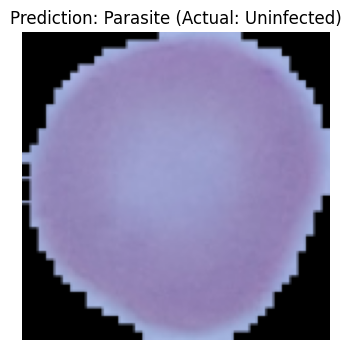

1/1 [==============================] - 0s 21ms/step


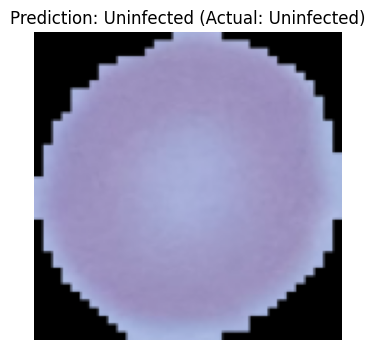

1/1 [==============================] - 0s 23ms/step


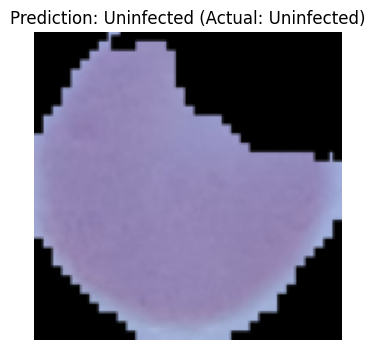

1/1 [==============================] - 0s 17ms/step


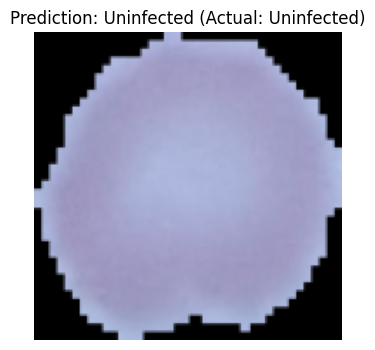

1/1 [==============================] - 0s 18ms/step


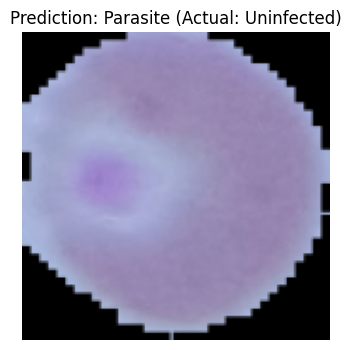

1/1 [==============================] - 0s 18ms/step


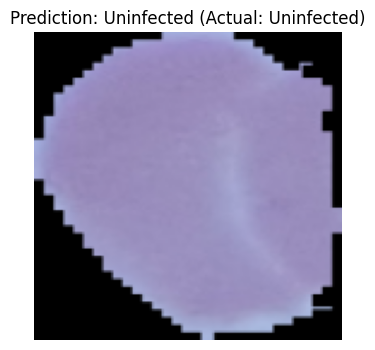

1/1 [==============================] - 0s 18ms/step


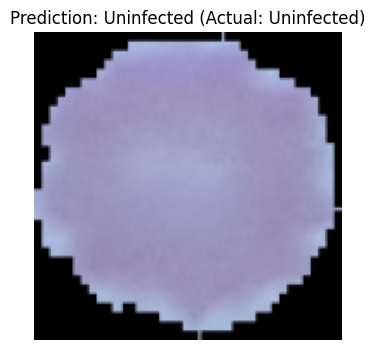

1/1 [==============================] - 0s 22ms/step


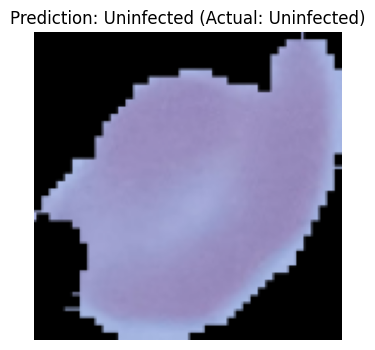

1/1 [==============================] - 0s 19ms/step


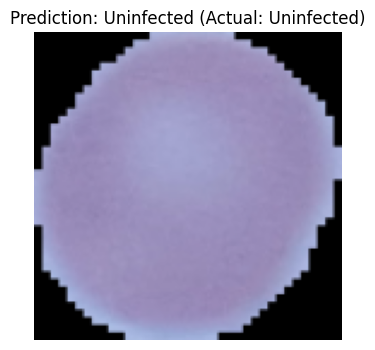

1/1 [==============================] - 0s 18ms/step


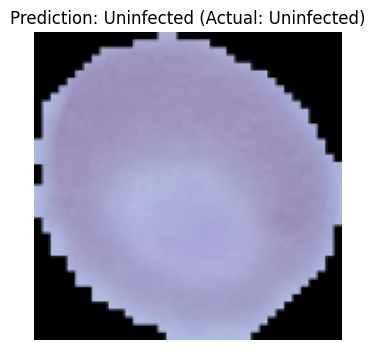

1/1 [==============================] - 0s 19ms/step


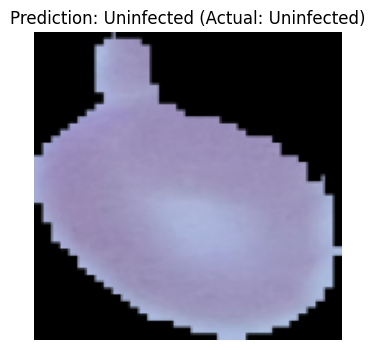

1/1 [==============================] - 0s 20ms/step


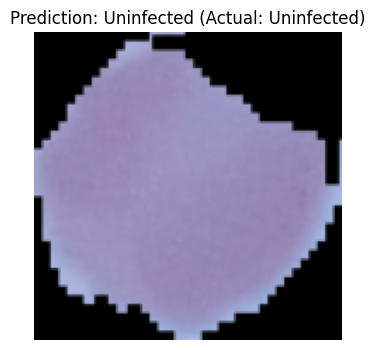

1/1 [==============================] - 0s 19ms/step


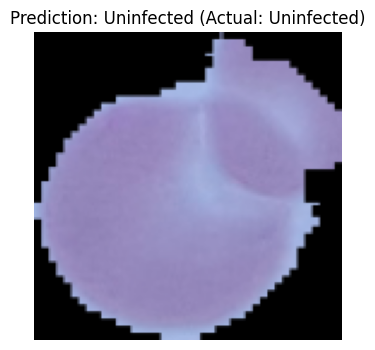

1/1 [==============================] - 0s 18ms/step


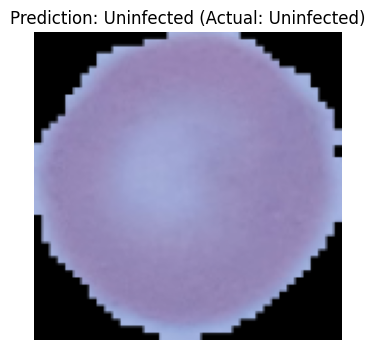

1/1 [==============================] - 0s 20ms/step


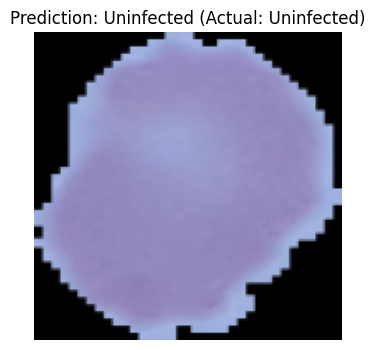

1/1 [==============================] - 0s 19ms/step


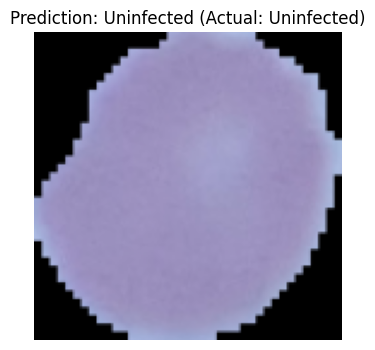

1/1 [==============================] - 0s 26ms/step


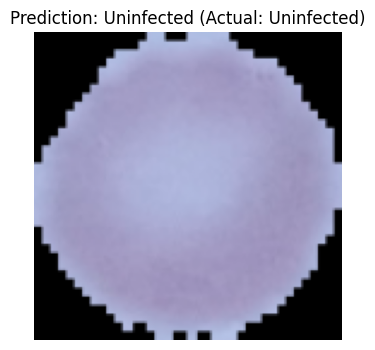

1/1 [==============================] - 0s 22ms/step


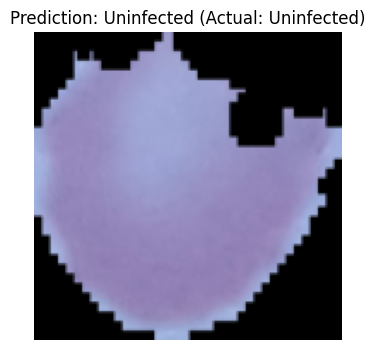

1/1 [==============================] - 0s 20ms/step


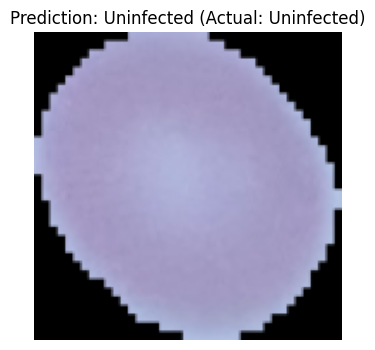

1/1 [==============================] - 0s 20ms/step


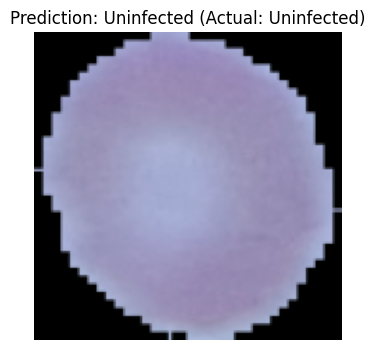

1/1 [==============================] - 0s 21ms/step


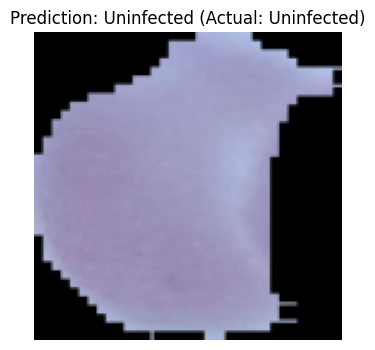

1/1 [==============================] - 0s 20ms/step


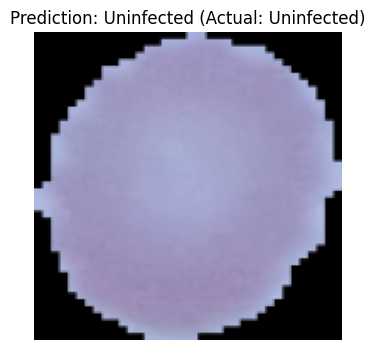

1/1 [==============================] - 0s 23ms/step


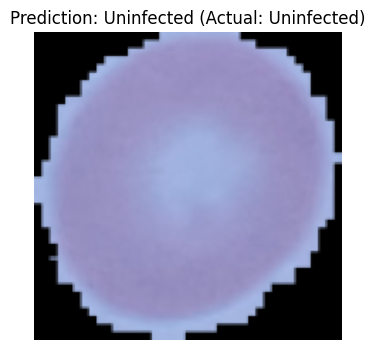

1/1 [==============================] - 0s 27ms/step


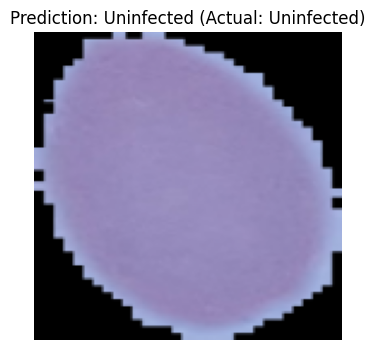

1/1 [==============================] - 0s 19ms/step


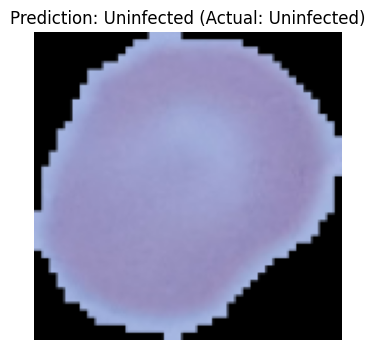

1/1 [==============================] - 0s 20ms/step


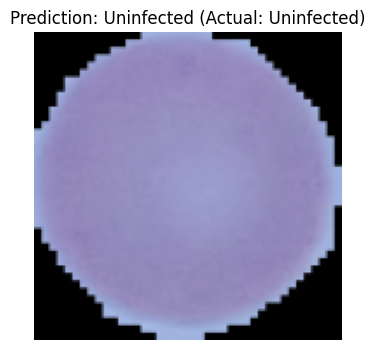

1/1 [==============================] - 0s 20ms/step


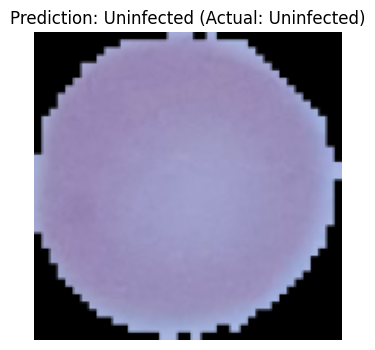

1/1 [==============================] - 0s 19ms/step


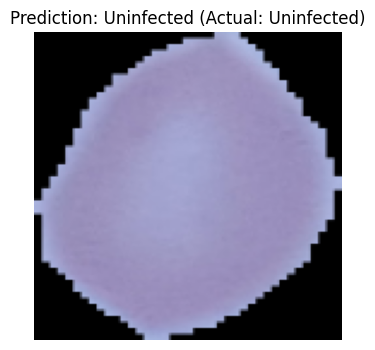

1/1 [==============================] - 0s 21ms/step


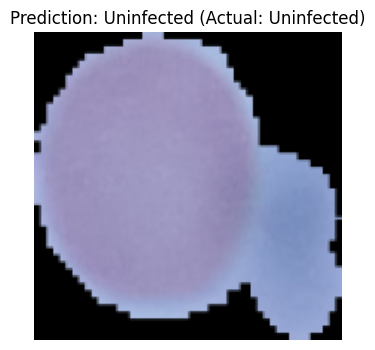

1/1 [==============================] - 0s 19ms/step


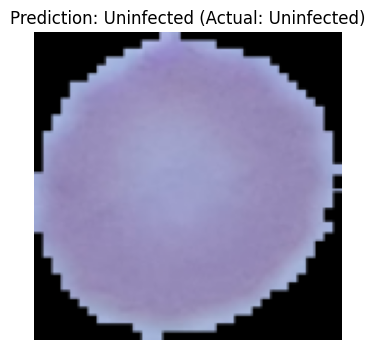

1/1 [==============================] - 0s 28ms/step


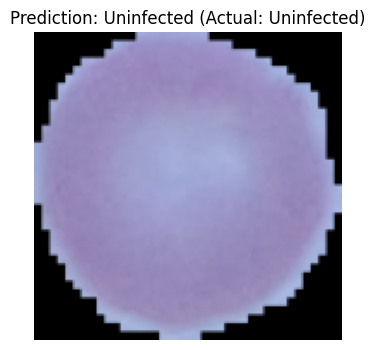

1/1 [==============================] - 0s 35ms/step


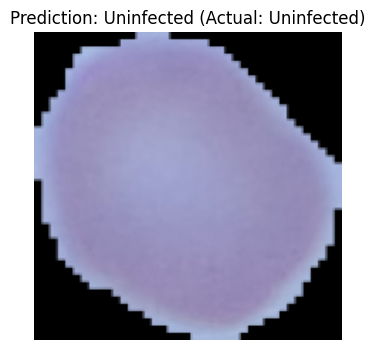

1/1 [==============================] - 0s 27ms/step


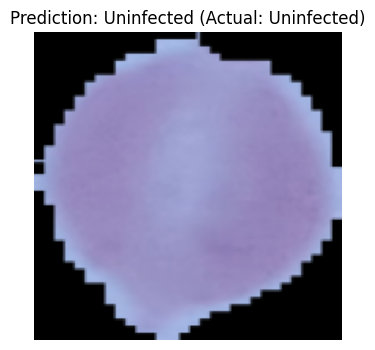

1/1 [==============================] - 0s 32ms/step


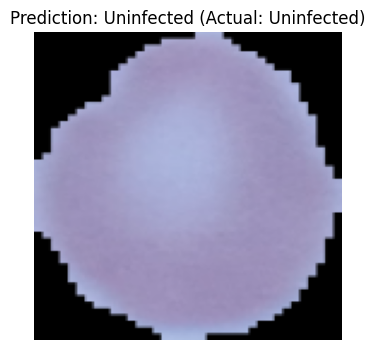

1/1 [==============================] - 0s 29ms/step


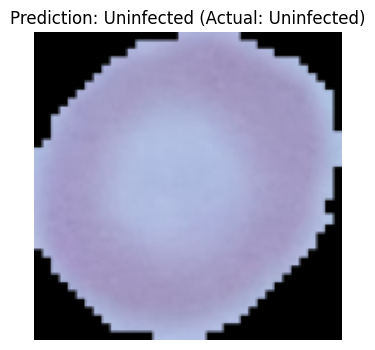

1/1 [==============================] - 0s 27ms/step


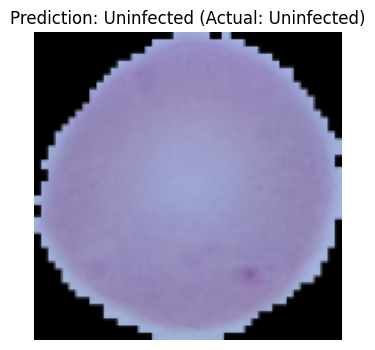

1/1 [==============================] - 0s 36ms/step


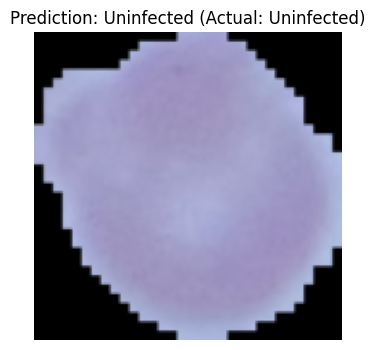

1/1 [==============================] - 0s 40ms/step


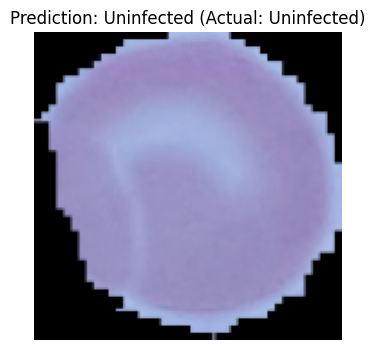

1/1 [==============================] - 0s 32ms/step


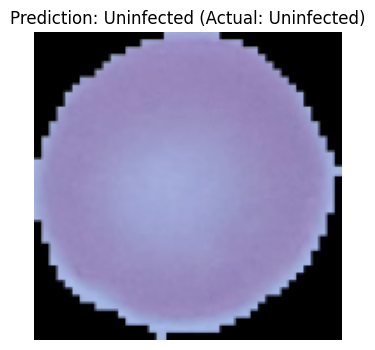

1/1 [==============================] - 0s 36ms/step


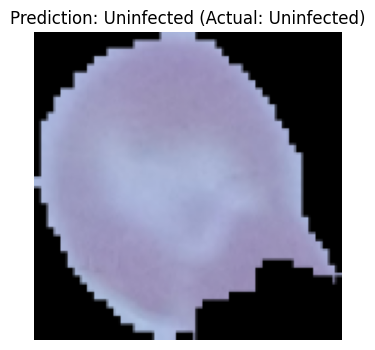

1/1 [==============================] - 0s 27ms/step


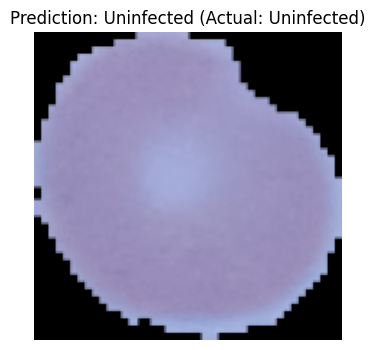

1/1 [==============================] - 0s 27ms/step


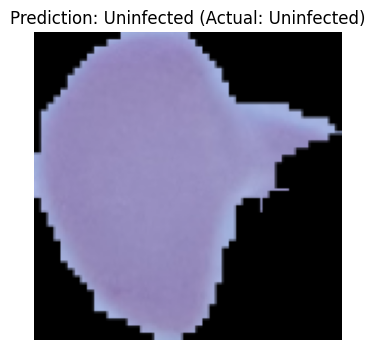

1/1 [==============================] - 0s 27ms/step


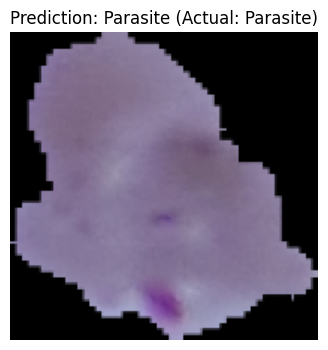

1/1 [==============================] - 0s 35ms/step


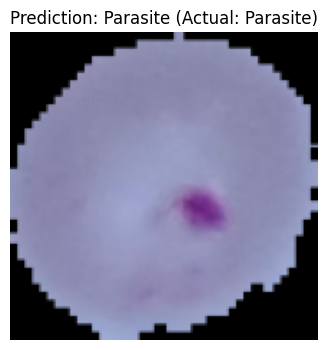

1/1 [==============================] - 0s 33ms/step


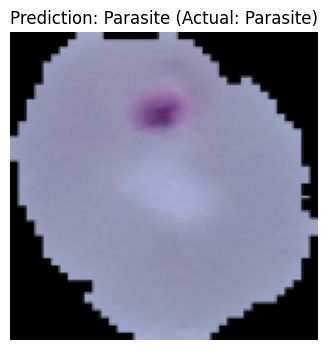

1/1 [==============================] - 0s 28ms/step


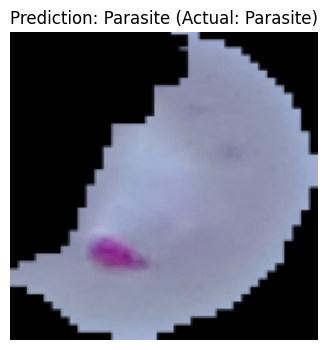

1/1 [==============================] - 0s 28ms/step


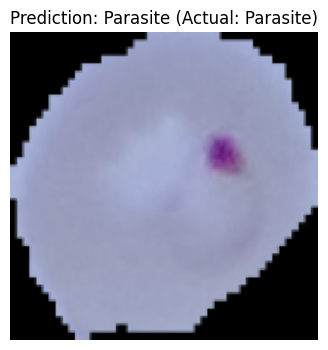

1/1 [==============================] - 0s 29ms/step


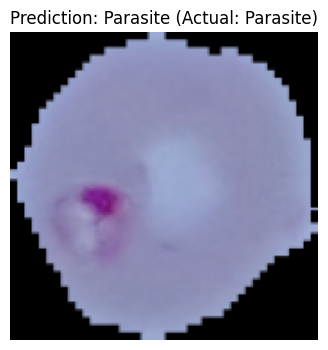

1/1 [==============================] - 0s 21ms/step


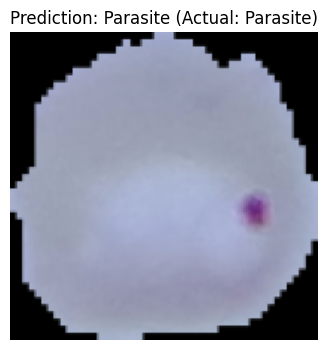

1/1 [==============================] - 0s 24ms/step


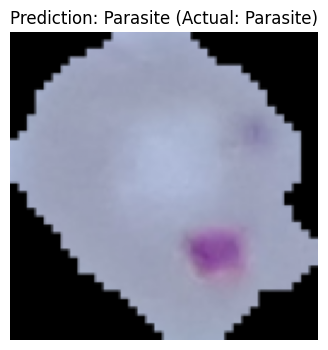

1/1 [==============================] - 0s 22ms/step


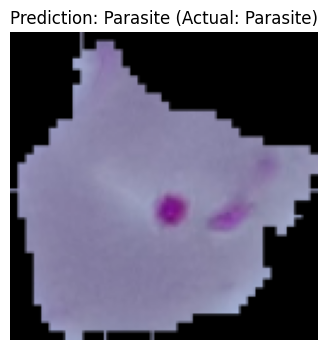

1/1 [==============================] - 0s 31ms/step


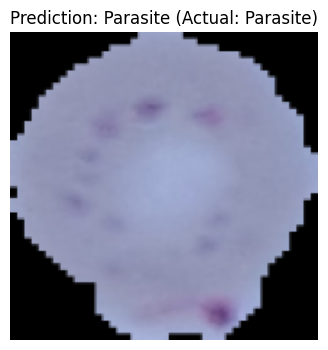

1/1 [==============================] - 0s 27ms/step


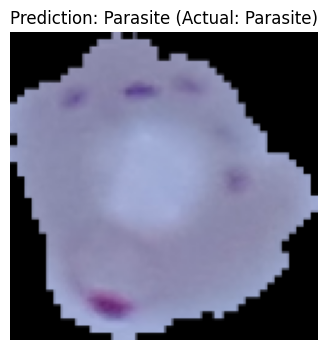

1/1 [==============================] - 0s 27ms/step


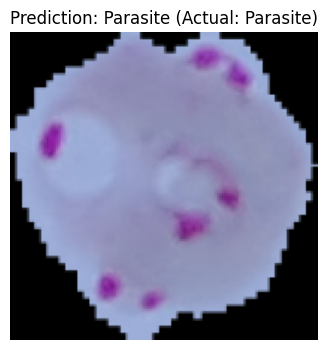

1/1 [==============================] - 0s 29ms/step


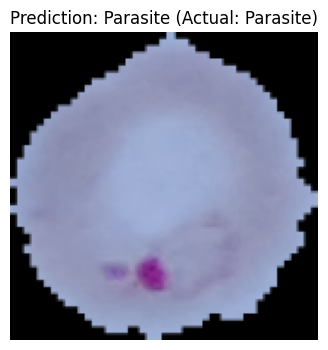

1/1 [==============================] - 0s 32ms/step


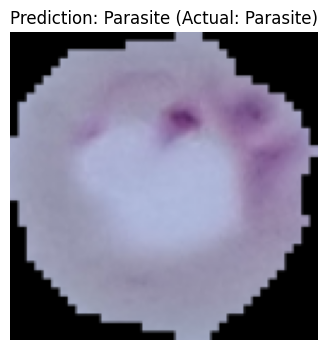

1/1 [==============================] - 0s 31ms/step


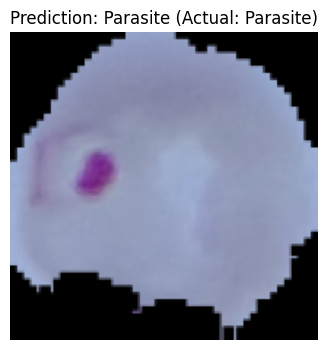

1/1 [==============================] - 0s 27ms/step


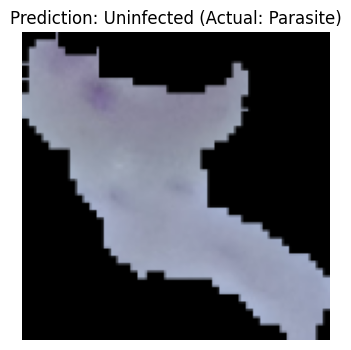

1/1 [==============================] - 0s 26ms/step


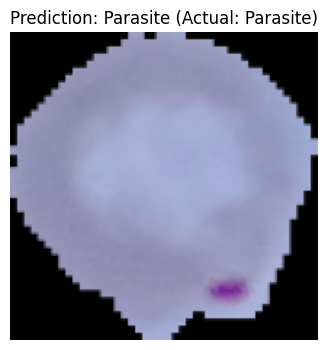

1/1 [==============================] - 0s 26ms/step


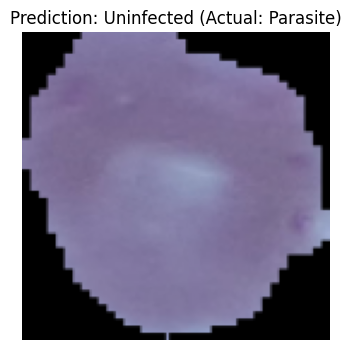

1/1 [==============================] - 0s 28ms/step


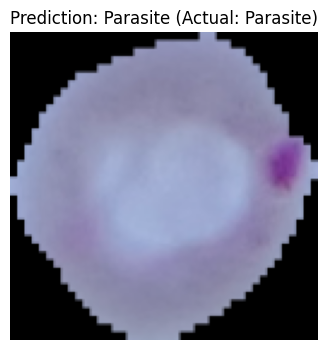

1/1 [==============================] - 0s 29ms/step


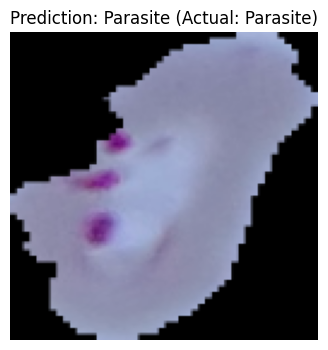

1/1 [==============================] - 0s 25ms/step


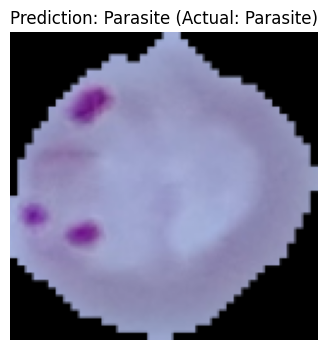

1/1 [==============================] - 0s 31ms/step


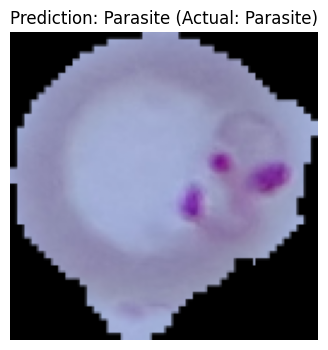

1/1 [==============================] - 0s 20ms/step


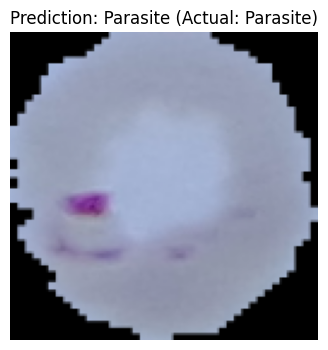

1/1 [==============================] - 0s 31ms/step


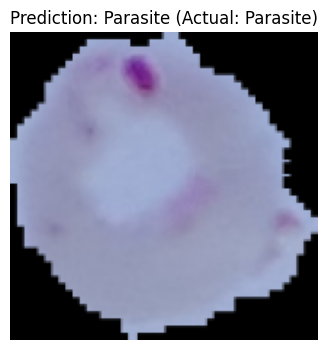

1/1 [==============================] - 0s 35ms/step


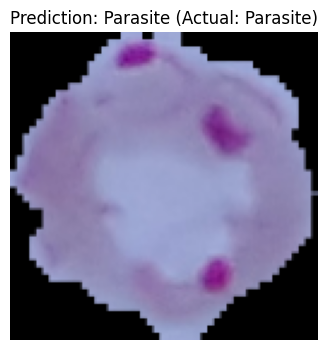

1/1 [==============================] - 0s 30ms/step


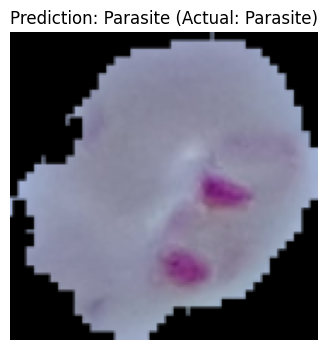

1/1 [==============================] - 0s 29ms/step


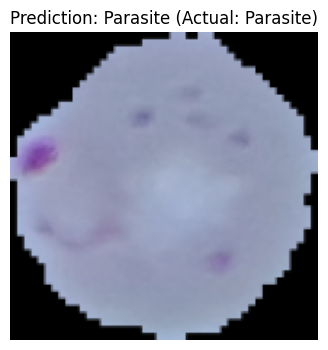

1/1 [==============================] - 0s 36ms/step


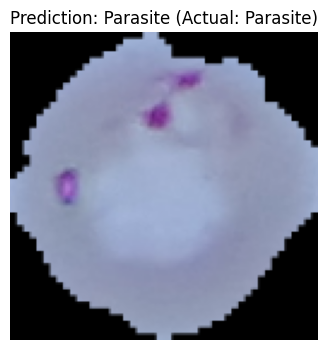

1/1 [==============================] - 0s 28ms/step


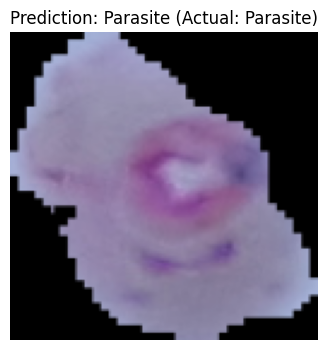

1/1 [==============================] - 0s 32ms/step


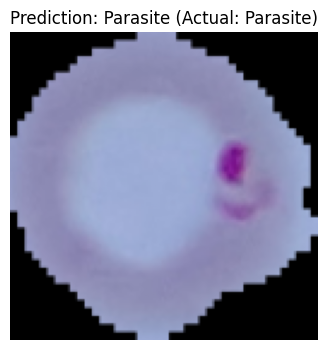

1/1 [==============================] - 0s 28ms/step


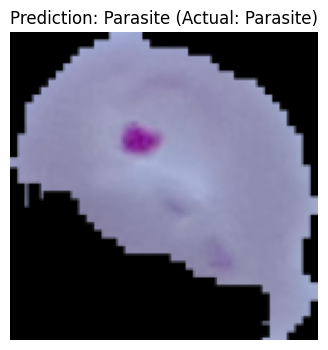

1/1 [==============================] - 0s 27ms/step


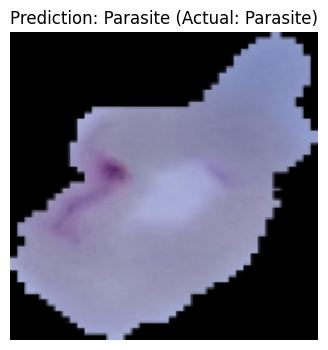

1/1 [==============================] - 0s 29ms/step


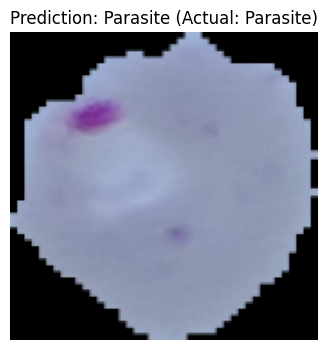

1/1 [==============================] - 0s 32ms/step


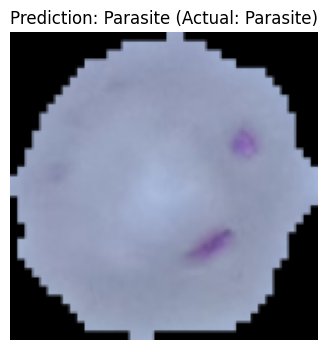

1/1 [==============================] - 0s 27ms/step


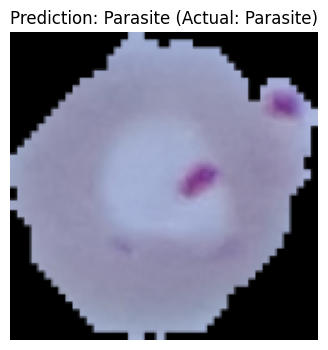

1/1 [==============================] - 0s 27ms/step


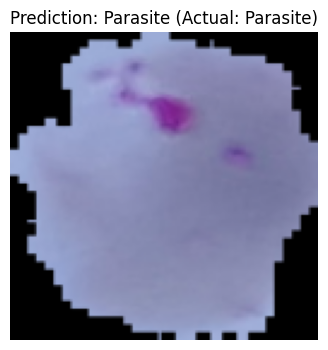

1/1 [==============================] - 0s 27ms/step


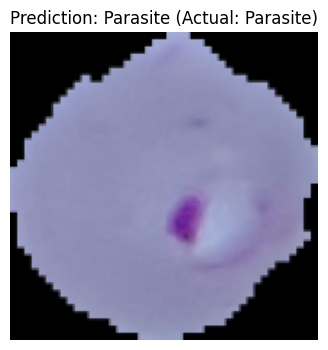

1/1 [==============================] - 0s 33ms/step


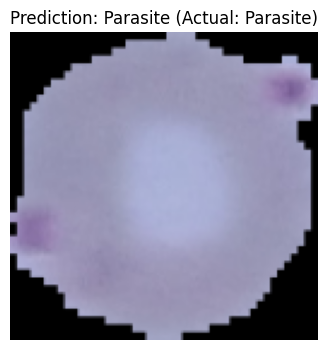

1/1 [==============================] - 0s 37ms/step


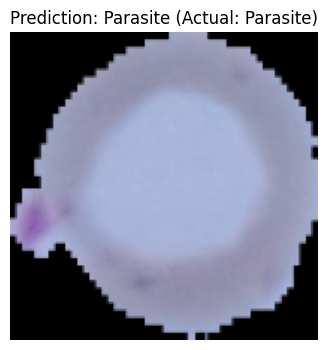

1/1 [==============================] - 0s 28ms/step


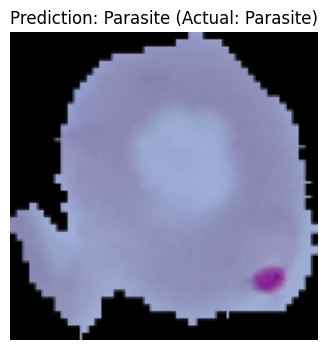

1/1 [==============================] - 0s 28ms/step


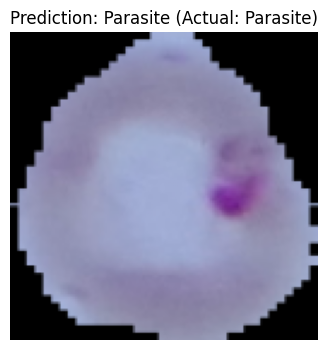

1/1 [==============================] - 0s 35ms/step


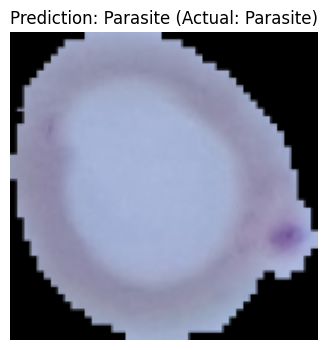

1/1 [==============================] - 0s 57ms/step


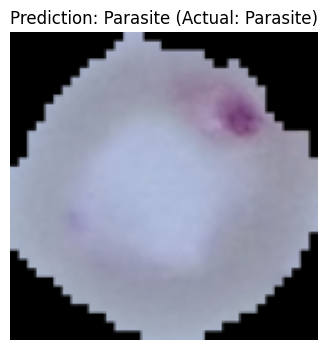

1/1 [==============================] - 0s 34ms/step


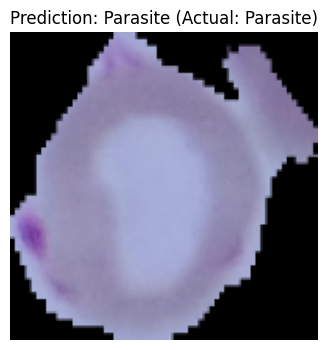

1/1 [==============================] - 0s 31ms/step


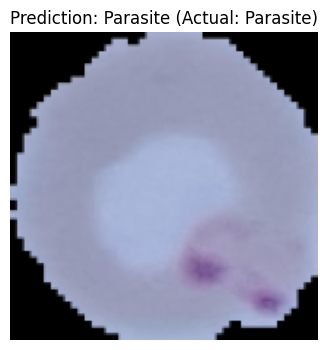

1/1 [==============================] - 0s 32ms/step


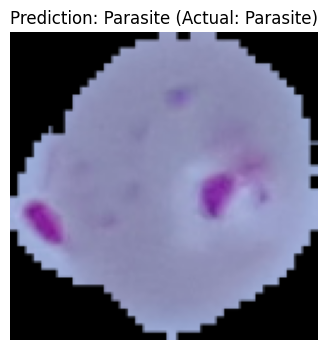

1/1 [==============================] - 0s 35ms/step


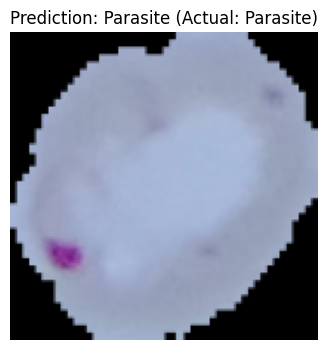

1/1 [==============================] - 0s 48ms/step


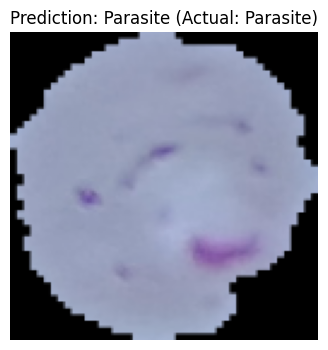

1/1 [==============================] - 0s 32ms/step


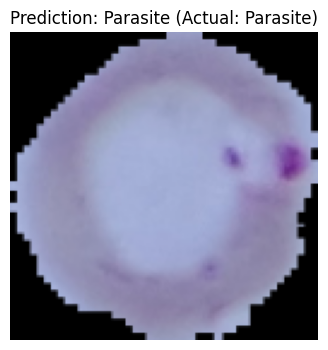

1/1 [==============================] - 0s 53ms/step


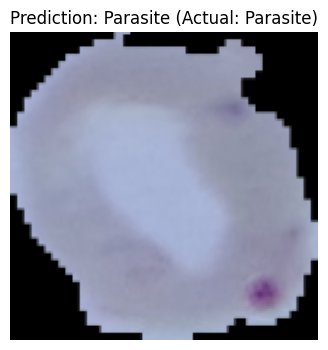

1/1 [==============================] - 0s 57ms/step


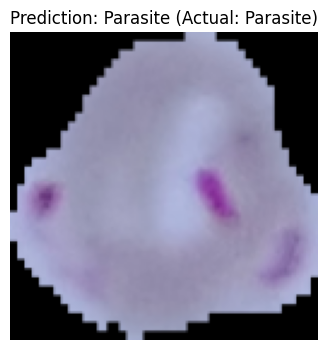

1/1 [==============================] - 0s 35ms/step


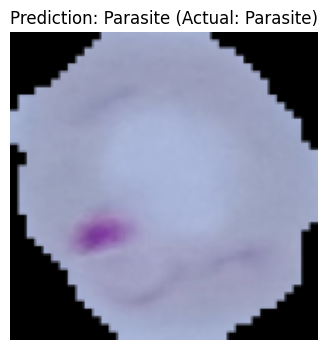

1/1 [==============================] - 0s 53ms/step


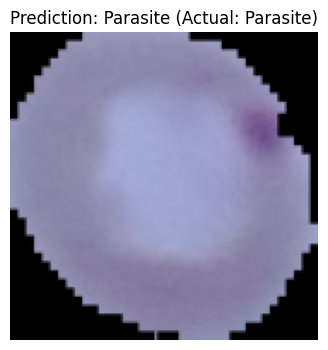

1/1 [==============================] - 0s 33ms/step


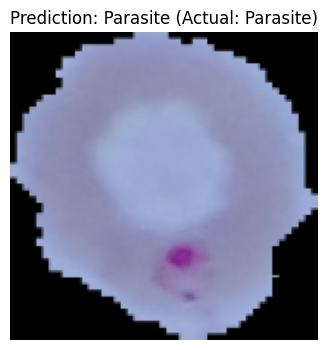

1/1 [==============================] - 0s 45ms/step


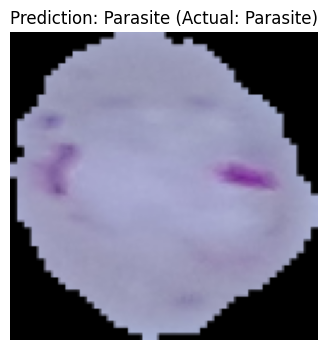

1/1 [==============================] - 0s 46ms/step


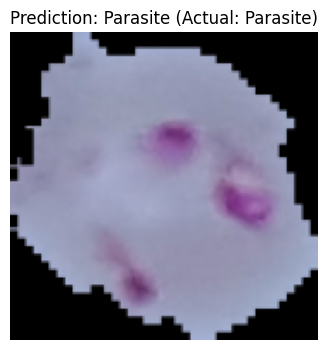

1/1 [==============================] - 0s 34ms/step


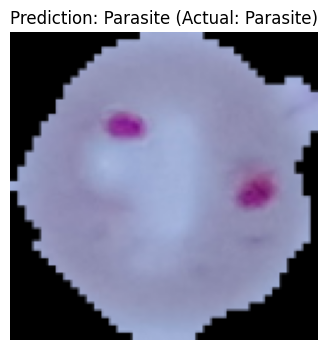

1/1 [==============================] - 0s 31ms/step


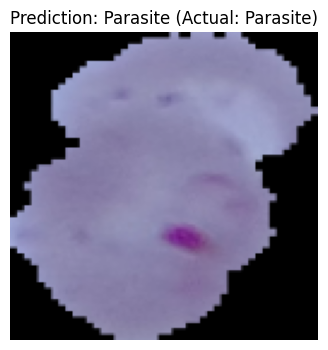

1/1 [==============================] - 0s 30ms/step


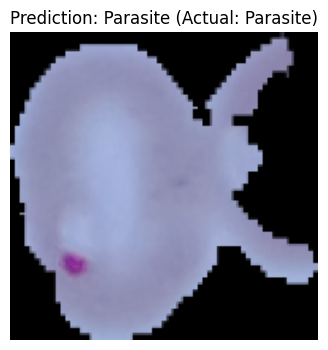

1/1 [==============================] - 0s 31ms/step


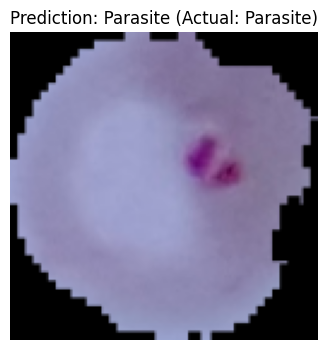

1/1 [==============================] - 0s 26ms/step


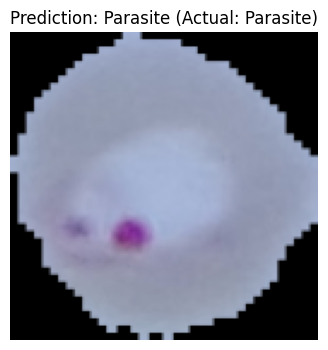

1/1 [==============================] - 0s 27ms/step


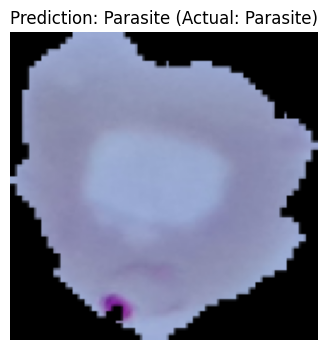

1/1 [==============================] - 0s 32ms/step


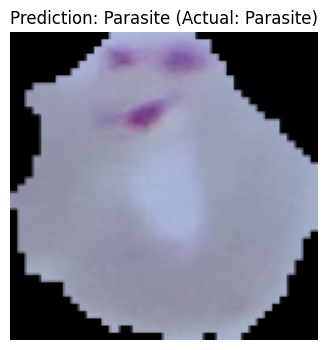

1/1 [==============================] - 0s 28ms/step


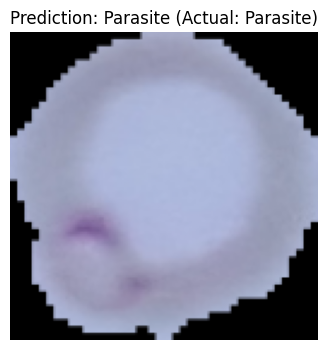

1/1 [==============================] - 0s 27ms/step


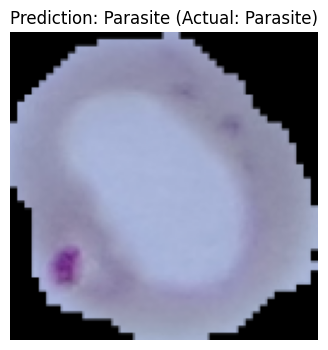

1/1 [==============================] - 0s 30ms/step


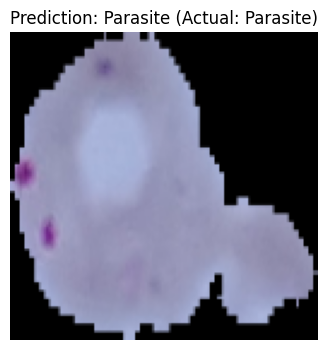

1/1 [==============================] - 0s 29ms/step


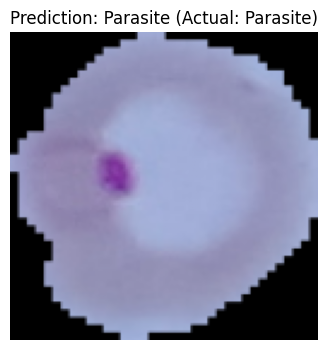

1/1 [==============================] - 0s 28ms/step


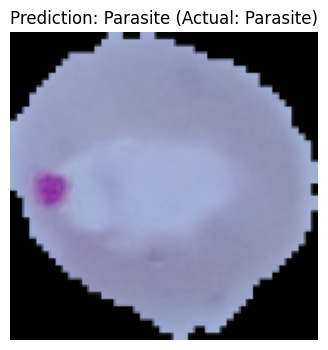

1/1 [==============================] - 0s 29ms/step


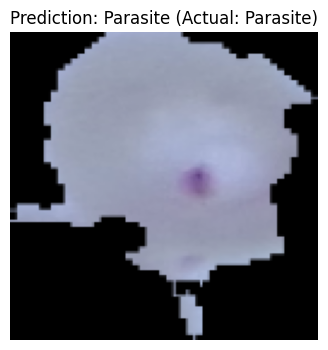

1/1 [==============================] - 0s 28ms/step


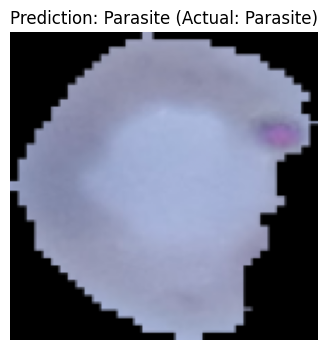

1/1 [==============================] - 0s 27ms/step


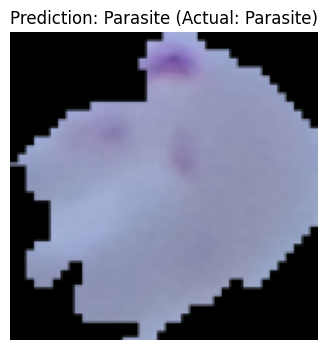

1/1 [==============================] - 0s 28ms/step


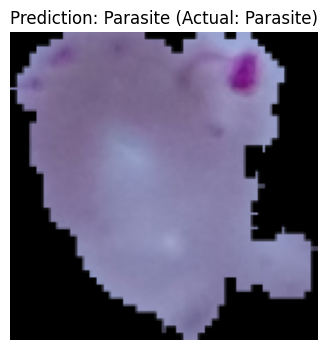

1/1 [==============================] - 0s 27ms/step


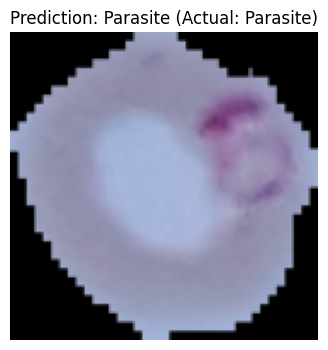

1/1 [==============================] - 0s 28ms/step


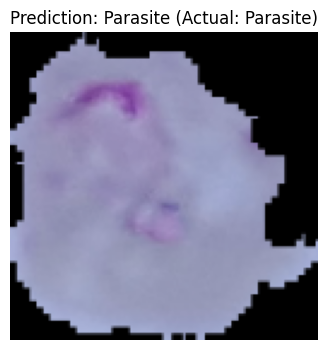

1/1 [==============================] - 0s 26ms/step


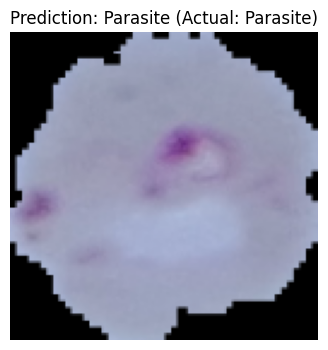

1/1 [==============================] - 0s 26ms/step


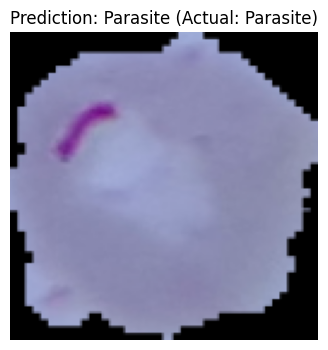

1/1 [==============================] - 0s 28ms/step


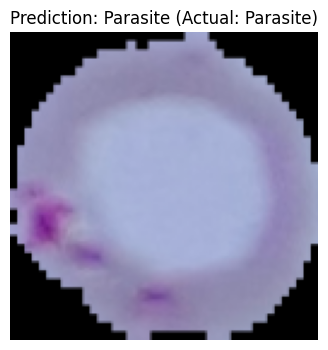

1/1 [==============================] - 0s 27ms/step


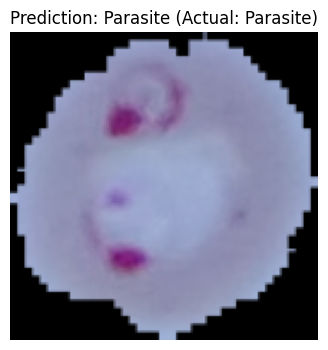

1/1 [==============================] - 0s 27ms/step


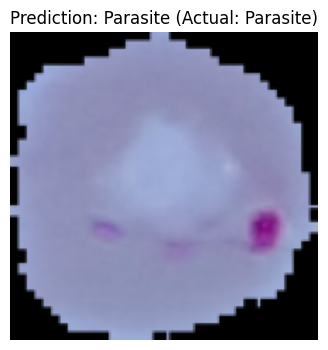

1/1 [==============================] - 0s 27ms/step


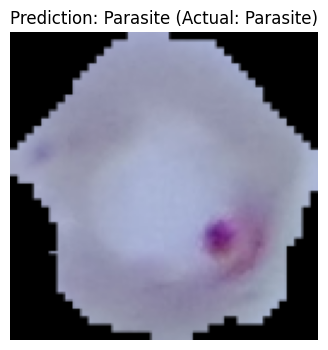

1/1 [==============================] - 0s 28ms/step


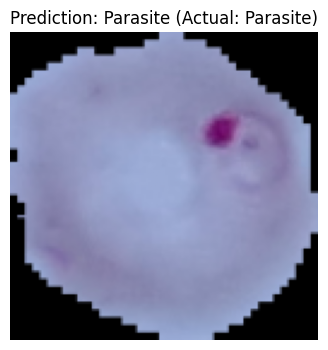

1/1 [==============================] - 0s 29ms/step


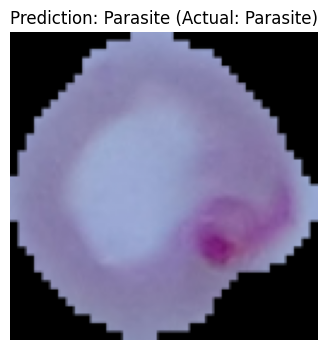

1/1 [==============================] - 0s 30ms/step


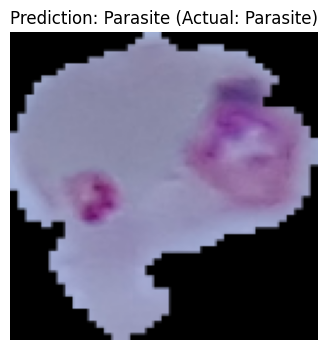

1/1 [==============================] - 0s 28ms/step


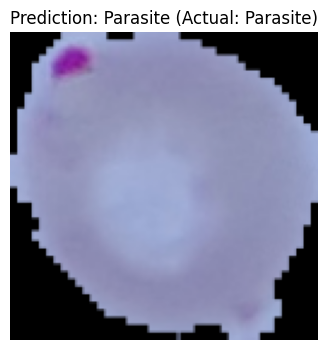

1/1 [==============================] - 0s 27ms/step


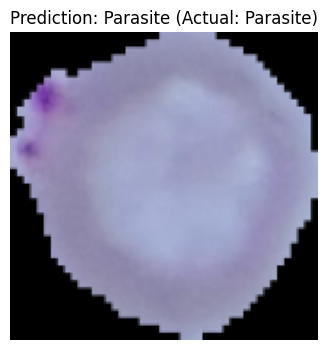

1/1 [==============================] - 0s 28ms/step


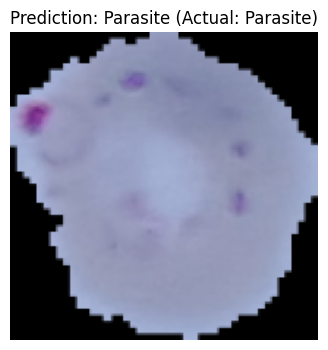

1/1 [==============================] - 0s 28ms/step


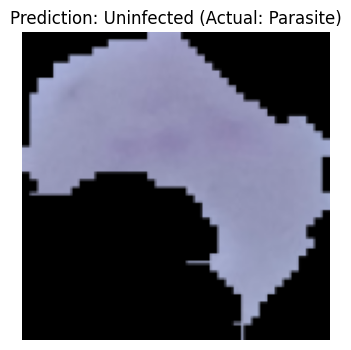

1/1 [==============================] - 0s 26ms/step


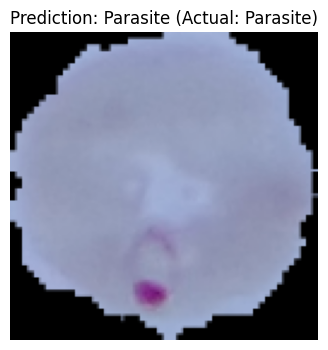

1/1 [==============================] - 0s 26ms/step


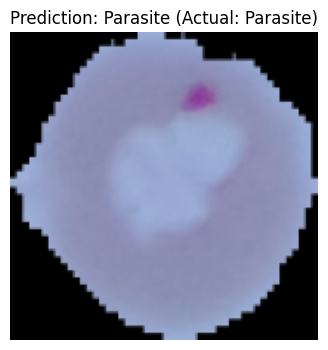

1/1 [==============================] - 0s 29ms/step


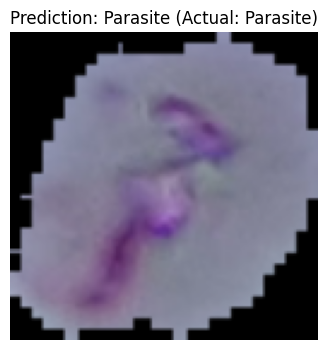

1/1 [==============================] - 0s 27ms/step


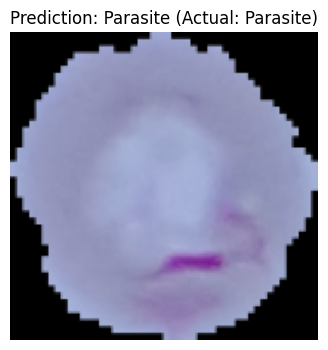

Correct predictions: 128/134
Accuracy: 95.52%


In [ ]:
import matplotlib.pyplot as plt

# Initialize a counter to keep track of correct predictions
correct_predictions = 0

# Predict all images in the test data
for n in range(x_test.shape[0]):
    img = x_test[n]

    input_img = np.expand_dims(img, axis=0)
    img_prediction = model_loaded.predict(input_img)

    if img_prediction >= 0.5:
        img_prediction = 1
    else:
        img_prediction = 0
    img_prediction = encodeTool.inverse_transform([img_prediction])

    actual_label = test_labels[n]

    # Display the image, prediction, and actual label
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.title("Prediction: {} (Actual: {})".format(img_prediction[0], actual_label))
    plt.axis('off')
    plt.show()

    if img_prediction == actual_label:
        correct_predictions += 1

# Check the accuracy
print("Correct predictions: {}/{}".format(correct_predictions, x_test.shape[0]))
accuracy = correct_predictions / x_test.shape[0] * 100
print("Accuracy: {:.2f}%".format(accuracy))
